<a href="https://colab.research.google.com/github/shumshersubashgautam/Yolo_Classification_Autism/blob/main/128CNN_Autism_Data_TPU.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
!cp /content/gdrive/MyDrive/autism.zip /content/

In [5]:
#!pip install -q tf-nightly-gpu-2.0-preview
# Load the TensorBoard notebook extension.
%load_ext tensorboard
#!pip install tensorflow==2.1.0 tensorflow-gpu==2.1.0
%tensorflow_version 2.x      
!pip install -U tensorflow-gpu    
!pip show tensorflow
     

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Name: tensorflow
Version: 2.11.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.9/dist-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grp

In [8]:

!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0


In [7]:
#Only for TPU
import os
import pprint
if 'COLAB_TPU_ADDR' not in os.environ:
  print('ERROR: Not connected to a TPU runtime; please see the first cell in this notebook for instructions!')
else:
  tpu_address = 'grpc://' + os.environ['COLAB_TPU_ADDR']
  print ('TPU address is', tpu_address)
     

TPU address is grpc://10.15.248.130:8470


In [9]:
import keras
     

Autistic
img_array:  (259, 215) uint8


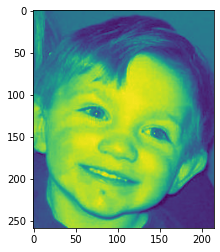

Non_Autistic
img_array:  (698, 499) uint8


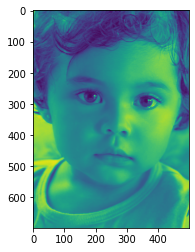

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
categories=["Autistic", "Non_Autistic"]
for category in categories:
  path=os.path.join('./autism/train/',category)
  for img in os.listdir(path):
    print(category)
    img_array=cv2.imread(os.path.join(path,img),cv2.IMREAD_GRAYSCALE)
    print('img_array: ',img_array.shape,img_array.dtype)
    plt.imshow(img_array)
    plt.show()
    break
     


In [12]:
import tensorflow as tf
training_data=[]
def create_training_data():
  for category in categories:
    path=os.path.join('./autism/train/',category)
    class_num=categories.index(category) # index as 0 and 1 to damaged and undamaged
    for img in os.listdir(path):
      img_array=cv2.imread(os.path.join(path,img), cv2.IMREAD_GRAYSCALE)
      new_array= cv2.resize(img_array,(128,128))
      #img_path = os.path.join(path,img)
      #print(img_path)
      #img_array = tf.image.decode_png(img_path,channels=1)
      #new_array = tf.cast(img_array,tf.float16)
      training_data.append([new_array,class_num])   
create_training_data()

In [13]:
print(len(training_data))

2654


In [14]:
from sklearn.model_selection import train_test_split
x=[]
y=[]
for features, label in training_data:
  x.append(features)
  y.append(label)
x = np.array(x).reshape(-1,128,128,1)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.162,shuffle=True)
print('x_train:'+str(x_train.shape))
print('y_train:'+str(len(y_train)))
print('x_test:'+str(x_test.shape))
print('y_test:'+str(len(y_test)))

x_train:(2224, 128, 128, 1)
y_train:2224
x_test:(430, 128, 128, 1)
y_test:430


In [15]:
#Data Argumentation
from keras.preprocessing.image import ImageDataGenerator
image_gen = ImageDataGenerator(rotation_range=15,
                               horizontal_flip=True,
                               vertical_flip=True,
                               data_format='channels_last')
def create_aug_gen(in_gen):
  for in_x,in_y in in_gen:
    g_x = image_gen.flow(x_train,y_train,batch_size=55)
    x,y=next(g_x)
    yield x,y

In [16]:
#Data Argumentation
import random
train_data = []
x_train_arg = []
y_train_arg = []
train_data.append([x_train,y_train])
cur_gen = create_aug_gen(iter(train_data))
t_x,t_y = next(cur_gen)
print('t_x',t_x.shape, t_x.dtype)
print('t_y',t_y.shape, t_y.dtype)
#for x in t_x:
#  plt.imshow(x.reshape(128,128))
#  plt.show()
x_train_arg = np.concatenate((x_train,t_x), axis=0)
y_train_arg = np.concatenate((y_train,t_y), axis=None)
print('x_train', x_train_arg.shape, x_train_arg.dtype)
print('y_train', y_train_arg.shape, y_train_arg.dtype)
#Shuffle data
random.shuffle([x_train_arg,y_train_arg])

t_x (55, 128, 128, 1) float32
t_y (55,) int64
x_train (2279, 128, 128, 1) float32
y_train (2279,) int64


Autistic


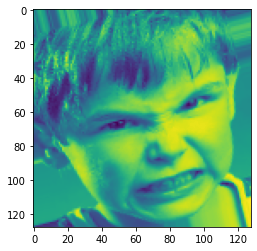

Autistic


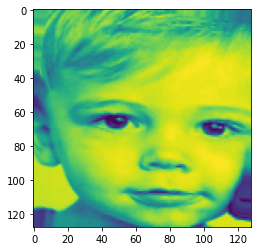

Non_Autistic


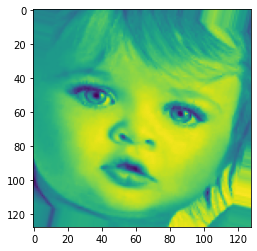

Non_Autistic


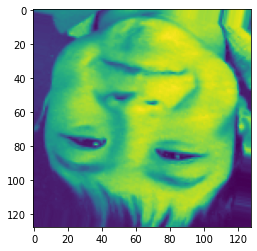

Autistic


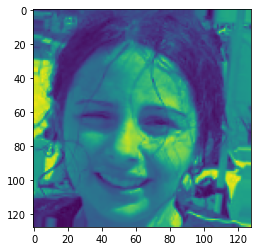

Non_Autistic


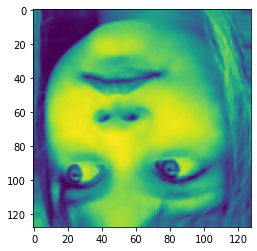

Autistic


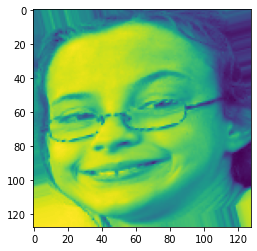

Non_Autistic


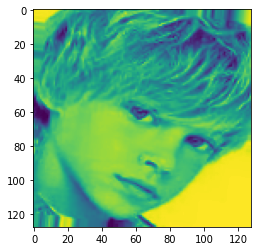

Non_Autistic


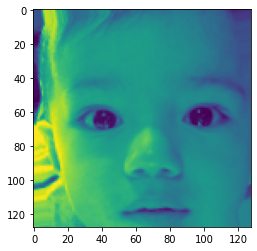

Non_Autistic


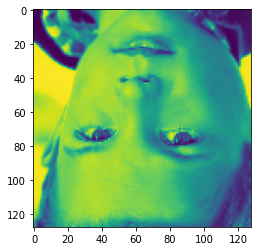

Autistic


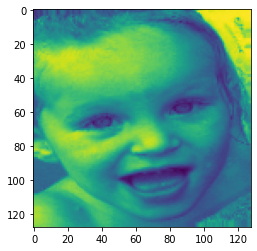

Autistic


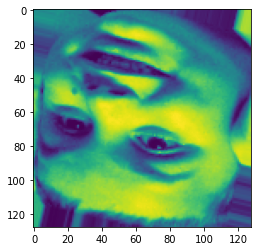

Non_Autistic


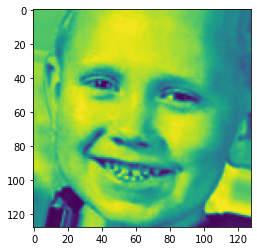

Non_Autistic


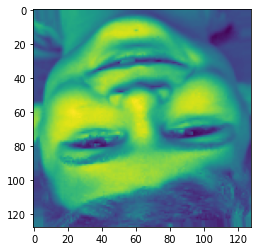

Non_Autistic


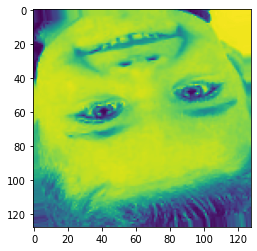

Autistic


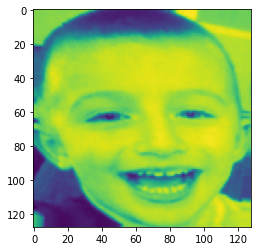

Autistic


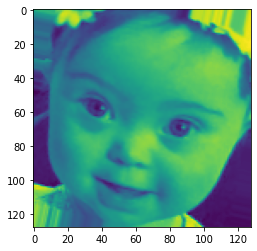

Non_Autistic


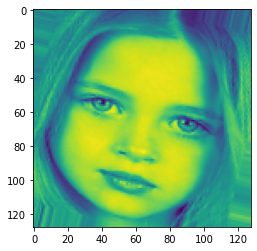

Autistic


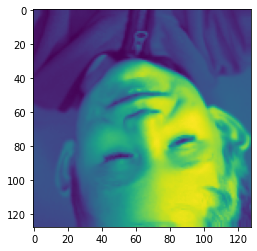

Autistic


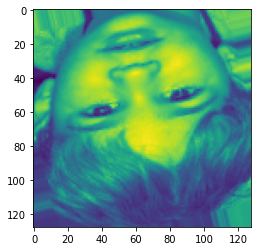

Autistic


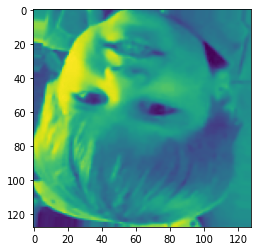

Non_Autistic


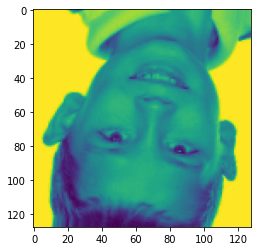

Autistic


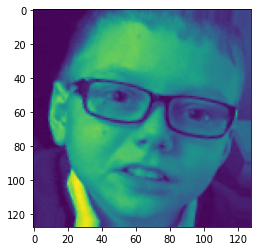

Autistic


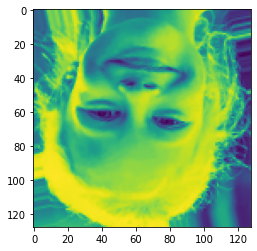

Autistic


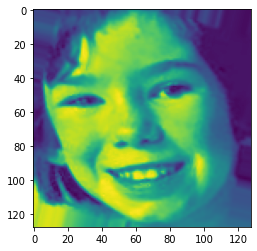

Non_Autistic


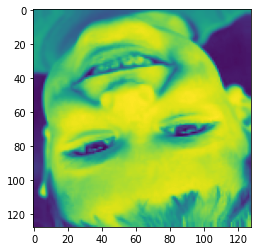

Non_Autistic


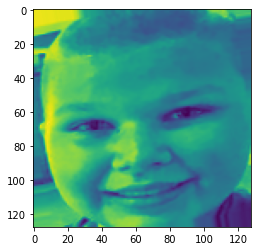

Autistic


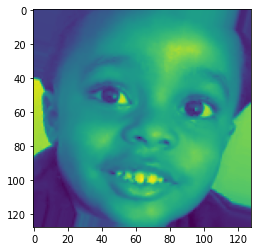

Non_Autistic


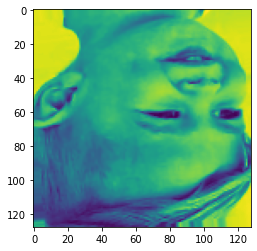

Autistic


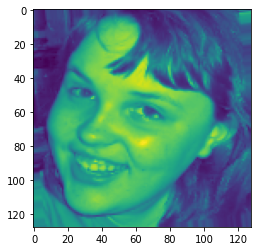

Autistic


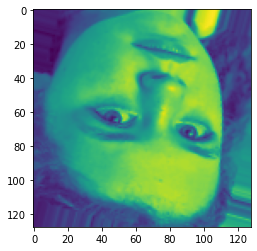

Autistic


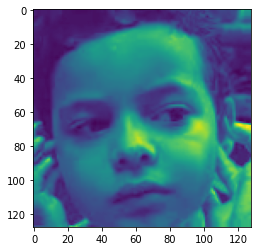

Autistic


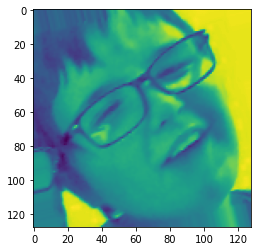

Autistic


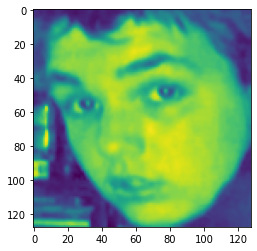

Autistic


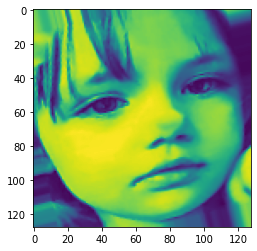

Non_Autistic


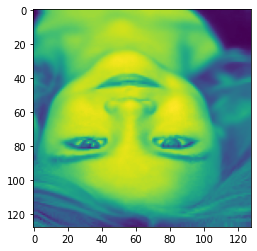

Non_Autistic


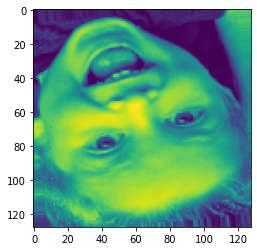

Autistic


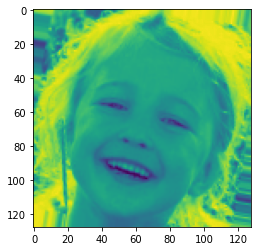

Non_Autistic


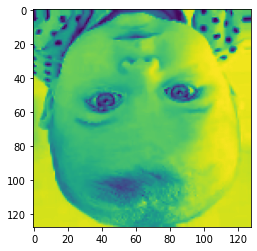

Non_Autistic


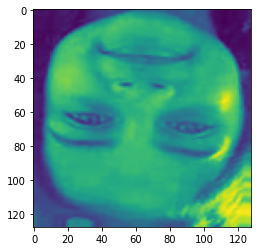

Non_Autistic


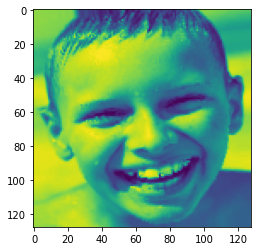

Non_Autistic


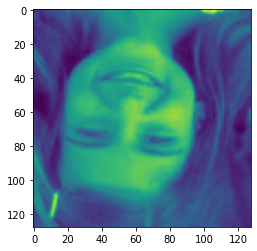

Non_Autistic


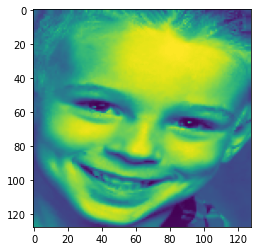

Non_Autistic


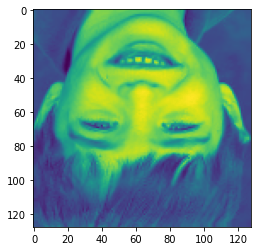

Non_Autistic


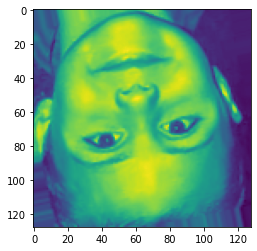

Non_Autistic


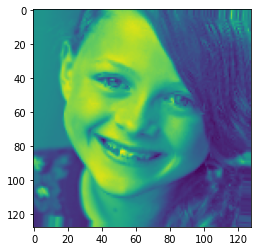

Autistic


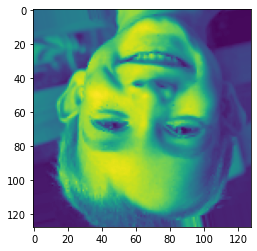

Non_Autistic


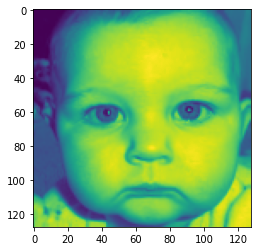

Autistic


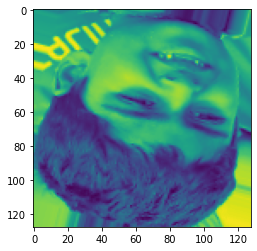

Non_Autistic


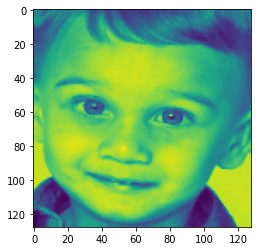

Autistic


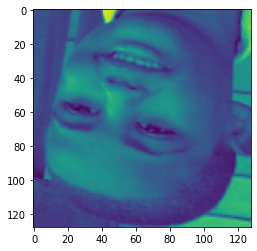

Autistic


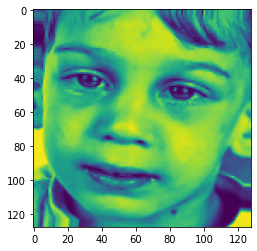

Non_Autistic


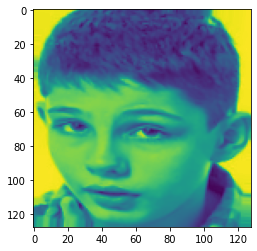

Non_Autistic


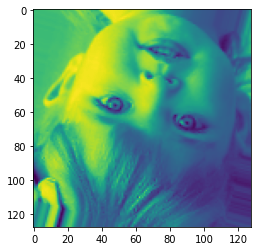

Autistic


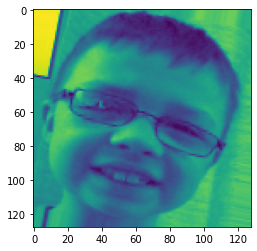

In [17]:
#Images generated by the data argumentation
i = 0
for x in t_x:
  print(categories[t_y[i]])
  plt.imshow(x.reshape(128,128))
  plt.show()
  i = i+1

In [18]:
import pickle
pickle_out=open("x.pickle","wb")
#pickle.dump(x,pickle_out)
pickle.dump(x_train,pickle_out)
pickle_out.close()

pickle_out=open("y.pickle","wb")
#pickle.dump(y,pickle_out)
pickle.dump(y_train,pickle_out)
pickle_out.close()

In [20]:
import tensorflow as tf
#TPU
resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='grpc://' + os.environ['COLAB_TPU_ADDR'])
print('Running on TPU ', resolver.cluster_spec().as_dict()['worker'])
tf.config.experimental_connect_to_cluster(resolver)
# This is the TPU initialization code that has to be at the beginning.
tf.tpu.experimental.initialize_tpu_system(resolver)
strategy = tf.distribute.TPUStrategy(resolver)

Running on TPU  ['10.15.248.130:8470']


In [26]:
!pip install tensorflow-gpu==1.15.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement tensorflow-gpu==1.15.0 (from versions: 2.5.0, 2.5.1, 2.5.2, 2.5.3, 2.6.0, 2.6.1, 2.6.2, 2.6.3, 2.6.4, 2.6.5, 2.7.0rc0, 2.7.0rc1, 2.7.0, 2.7.1, 2.7.2, 2.7.3, 2.7.4, 2.8.0rc0, 2.8.0rc1, 2.8.0, 2.8.1, 2.8.2, 2.8.3, 2.8.4, 2.9.0rc0, 2.9.0rc1, 2.9.0rc2, 2.9.0, 2.9.1, 2.9.2, 2.9.3, 2.10.0rc0, 2.10.0rc1, 2.10.0rc2, 2.10.0rc3, 2.10.0, 2.10.1, 2.11.0rc0, 2.11.0rc1, 2.11.0rc2, 2.11.0, 2.12.0)
ERROR: No matching distribution found for tensorflow-gpu==1.15.0


In [27]:
tf.compat.v1.mixed_precision.enable_mixed_precision_graph_rewrite(
    opt, loss_scale='dynamic'
)

NameError: ignored

In [33]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()


In [38]:
from tensorflow.keras import Sequential,Model
from tensorflow.keras.layers import Dense,SpatialDropout2D, Dropout, Activation, Flatten, Conv2D, MaxPooling2D, BatchNormalization,Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import utils as np_utils
import datetime

#x_training=x_training/255.0

x = np.array(x_train).astype(np.float32)/255.0

#x = np.array(x_train).astype(np.float16)/255.0
y = np.array(y_train).astype(np.float16)

#y = np.array(y_train).astype(np.float32)
y_testing = np.array(y_test).astype(np.float16)


print('x_train:',x.shape,x.dtype)
print('y_train:',y.shape,y.dtype)
print('x_test:',x_test.shape,x.dtype)
#print('y_test:',y_test.shape,y.dtype)

def create_model(x,name):
  tf.keras.backend.clear_session()

  inputs = Input(x.shape[1:])

  #Layer 1
  layer = Conv2D(64,(3,3),activation='relu')(inputs)
  layer = MaxPooling2D(pool_size=(3,3))(layer)
  layer = Dropout(0.5)(layer)

  #Layer 2
  layer = Conv2D(64,(3,3),activation='relu')(layer)
  layer = MaxPooling2D(pool_size=(3,3))(layer)
  layer = Dropout(0.5)(layer)

  #Layer 3
  layer = Conv2D(64,(3,3),activation='relu')(layer)
  layer = MaxPooling2D(pool_size=(3,3))(layer)
  layer = Dropout(0.5)(layer)

  #Layer 4
  layer = Conv2D(64,(3,3),activation='relu')(layer)
  #layer = Activation('relu')(layer)

  layer = Flatten()(layer)
  layer = Dense(64)(layer)
  #layer = Activation('relu')(layer)

  output = Dense(1,activation='sigmoid')(layer)
  return Model(inputs=inputs,outputs=output,name=name)

#Testing with TPU device (it´s needed to create the network in this way)
def create_model_sequential(x,name):
  model = Sequential(name=name)
  model.add(Conv2D(64,(3,3),input_shape = x.shape[1:],activation="relu"))
  model.add(MaxPooling2D(pool_size=(3,3)))
  model.add(Dropout(0.5))



  model.add(Conv2D(64,(3,3),activation="relu"))
  model.add(MaxPooling2D(pool_size=(3,3)))  
  model.add(Dropout(0.5))


  model.add(Conv2D(64,(3,3),activation="relu"))
  model.add(MaxPooling2D(pool_size=(3,3)))  
  model.add(Dropout(0.5))

  # added one more layer 
  model.add(Conv2D(64,(3,3),activation="relu"))
  




  model.add(Flatten())
  model.add(Dense(64))
      


  model.add(Dense(1))  
            
  model.add(Activation("sigmoid"))
  return model

time_saver = datetime.datetime.now().strftime("%d%m%Y-%H%M%S")
#Only for TPU
#with strategy.scope():
  #tf.compat.v1.disable_eager_execution() 
  #model = create_model(x,time_saver)
model = create_model_sequential(x,time_saver)
op = tf.keras.optimizers.Adam(learning_rate=0.001)
#op = Adam()
op = tf.train.experimental.enable_mixed_precision_graph_rewrite(op)
model.compile(loss=tf.keras.losses.BinaryCrossentropy(),optimizer= op, metrics=['accuracy',tf.keras.metrics.BinaryCrossentropy()])


#Model Summary
model.summary()

print(time_saver)     

x_train: (2224, 128, 128, 1) float32
y_train: (2224,) float16
x_test: (430, 128, 128, 1) float32
Model: "29032023-083303"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_40 (Conv2D)          (None, 126, 126, 64)      640       
                                                                 
 max_pooling2d_30 (MaxPoolin  (None, 42, 42, 64)       0         
 g2D)                                                            
                                                                 
 dropout_30 (Dropout)        (None, 42, 42, 64)        0         
                                                                 
 conv2d_41 (Conv2D)          (None, 40, 40, 64)        36928     
                                                                 
 max_pooling2d_31 (MaxPoolin  (None, 13, 13, 64)       0         
 g2D)                                                            
                    

In [22]:
!pip install tensorflow==1.15.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement tensorflow==1.15.0 (from versions: 2.5.0, 2.5.1, 2.5.2, 2.5.3, 2.6.0rc0, 2.6.0rc1, 2.6.0rc2, 2.6.0, 2.6.1, 2.6.2, 2.6.3, 2.6.4, 2.6.5, 2.7.0rc0, 2.7.0rc1, 2.7.0, 2.7.1, 2.7.2, 2.7.3, 2.7.4, 2.8.0rc0, 2.8.0rc1, 2.8.0, 2.8.1, 2.8.2, 2.8.3, 2.8.4, 2.9.0rc0, 2.9.0rc1, 2.9.0rc2, 2.9.0, 2.9.1, 2.9.2, 2.9.3, 2.10.0rc0, 2.10.0rc1, 2.10.0rc2, 2.10.0rc3, 2.10.0, 2.10.1, 2.11.0rc0, 2.11.0rc1, 2.11.0rc2, 2.11.0, 2.11.1, 2.12.0rc0, 2.12.0rc1, 2.12.0)
ERROR: No matching distribution found for tensorflow==1.15.0


In [39]:
#Callback to measure the time spending in each epoch
from tensorflow.keras.callbacks import Callback
import time
class TimeHistory(Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)

In [40]:
import time
import os
from tensorflow.keras.callbacks import TensorBoard,ModelCheckpoint
#Time per each epoch
time_callback = TimeHistory()
#TensorBoard  
name_file= "128CNN_"+time_saver
filepath = '/content/models/model/autism/nautism/Best_128CNN-'+time_saver+'.h5'
logdir = os.path.join("logs","autism","nautism",name_file)
#tensorboard = TensorBoard(log_dir=logdir, write_graph=True, write_images=True,
#                          histogram_freq=1)
tensorboard = TensorBoard(log_dir=logdir, write_graph=True, write_images=True,
                         histogram_freq=0,update_freq='epoch',profile_batch=3)

#Only for TPU
tensorboard_tpu = TensorBoard(log_dir=logdir)
#Model Checkpoint (callbacks)
checkpoint = ModelCheckpoint(filepath,verbose=1,monitor='accuracy',save_best_only = True, mode='max')
callbacks_list = [tensorboard,checkpoint,time_callback]

start = time.time()

history=model.fit(x=x,y=y, batch_size=32,epochs=100,validation_split=0.145,shuffle=True,callbacks=callbacks_list,use_multiprocessing=True) 
#history=model.fit(x=x,y=y, batch_size=32,epochs=200,validation_split=0.145,shuffle=True,use_multiprocessing=True) 
#Only for TPU
#history=model.fit(x=x,y=y, batch_size=32,epochs=100,validation_split=0.145,shuffle=True) 

end = time.time()

Train on 1901 samples, validate on 323 samples
Epoch 1/100
1901/1901 [==============================] - ETA: 0s - loss: 0.6983 - acc: 0.4961 - binary_crossentropy: 0.6983

/usr/local/lib/python3.9/dist-packages/keras/engine/training_v1.py:2333: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


1901/1901 [==============================] - 65s 34ms/sample - loss: 0.6983 - acc: 0.4961 - binary_crossentropy: 0.6983 - val_loss: 0.6929 - val_acc: 0.5108 - val_binary_crossentropy: 0.6929
Epoch 2/100
1901/1901 [==============================] - ETA: 0s - loss: 0.6937 - acc: 0.5018 - binary_crossentropy: 0.6937

1901/1901 [==============================] - 71s 37ms/sample - loss: 0.6937 - acc: 0.5018 - binary_crossentropy: 0.6937 - val_loss: 0.6935 - val_acc: 0.5108 - val_binary_crossentropy: 0.6935
Epoch 3/100
1901/1901 [==============================] - ETA: 0s - loss: 0.6913 - acc: 0.5376 - binary_crossentropy: 0.6913

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.6913 - acc: 0.5376 - binary_crossentropy: 0.6913 - val_loss: 0.6938 - val_acc: 0.5108 - val_binary_crossentropy: 0.6938
Epoch 4/100
1901/1901 [==============================] - ETA: 0s - loss: 0.6883 - acc: 0.5376 - binary_crossentropy: 0.6883

1901/1901 [==============================] - 64s 34ms/sample - loss: 0.6883 - acc: 0.5376 - binary_crossentropy: 0.6883 - val_loss: 0.6953 - val_acc: 0.5108 - val_binary_crossentropy: 0.6953
Epoch 5/100
1901/1901 [==============================] - ETA: 0s - loss: 0.6819 - acc: 0.5623 - binary_crossentropy: 0.6819

1901/1901 [==============================] - 64s 34ms/sample - loss: 0.6819 - acc: 0.5623 - binary_crossentropy: 0.6819 - val_loss: 0.6805 - val_acc: 0.5759 - val_binary_crossentropy: 0.6805
Epoch 6/100
1901/1901 [==============================] - ETA: 0s - loss: 0.6576 - acc: 0.6081 - binary_crossentropy: 0.6576

1901/1901 [==============================] - 64s 34ms/sample - loss: 0.6576 - acc: 0.6081 - binary_crossentropy: 0.6576 - val_loss: 0.6601 - val_acc: 0.6347 - val_binary_crossentropy: 0.6601
Epoch 7/100
1901/1901 [==============================] - ETA: 0s - loss: 0.6398 - acc: 0.6407 - binary_crossentropy: 0.6398

1901/1901 [==============================] - 64s 33ms/sample - loss: 0.6398 - acc: 0.6407 - binary_crossentropy: 0.6398 - val_loss: 0.6402 - val_acc: 0.6192 - val_binary_crossentropy: 0.6402
Epoch 8/100
1901/1901 [==============================] - ETA: 0s - loss: 0.6272 - acc: 0.6491 - binary_crossentropy: 0.6272

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.6272 - acc: 0.6491 - binary_crossentropy: 0.6272 - val_loss: 0.6360 - val_acc: 0.6502 - val_binary_crossentropy: 0.6360
Epoch 9/100
1901/1901 [==============================] - ETA: 0s - loss: 0.6177 - acc: 0.6649 - binary_crossentropy: 0.6177

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.6177 - acc: 0.6649 - binary_crossentropy: 0.6177 - val_loss: 0.6340 - val_acc: 0.6656 - val_binary_crossentropy: 0.6340
Epoch 10/100
1901/1901 [==============================] - ETA: 0s - loss: 0.6105 - acc: 0.6681 - binary_crossentropy: 0.6105

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.6105 - acc: 0.6681 - binary_crossentropy: 0.6105 - val_loss: 0.6293 - val_acc: 0.6471 - val_binary_crossentropy: 0.6293
Epoch 11/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5947 - acc: 0.6807 - binary_crossentropy: 0.5947

1901/1901 [==============================] - 64s 34ms/sample - loss: 0.5947 - acc: 0.6807 - binary_crossentropy: 0.5947 - val_loss: 0.6131 - val_acc: 0.6533 - val_binary_crossentropy: 0.6131
Epoch 12/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5866 - acc: 0.6944 - binary_crossentropy: 0.5866

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.5866 - acc: 0.6944 - binary_crossentropy: 0.5866 - val_loss: 0.6127 - val_acc: 0.6502 - val_binary_crossentropy: 0.6127
Epoch 13/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5791 - acc: 0.7049 - binary_crossentropy: 0.5791

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.5791 - acc: 0.7049 - binary_crossentropy: 0.5791 - val_loss: 0.6123 - val_acc: 0.6502 - val_binary_crossentropy: 0.6123
Epoch 14/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5822 - acc: 0.6944 - binary_crossentropy: 0.5822

1901/1901 [==============================] - 61s 32ms/sample - loss: 0.5822 - acc: 0.6944 - binary_crossentropy: 0.5822 - val_loss: 0.6133 - val_acc: 0.6533 - val_binary_crossentropy: 0.6133
Epoch 15/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5800 - acc: 0.6959 - binary_crossentropy: 0.5800

1901/1901 [==============================] - 62s 33ms/sample - loss: 0.5800 - acc: 0.6959 - binary_crossentropy: 0.5800 - val_loss: 0.6013 - val_acc: 0.6594 - val_binary_crossentropy: 0.6013
Epoch 16/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5753 - acc: 0.6970 - binary_crossentropy: 0.5753

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.5753 - acc: 0.6970 - binary_crossentropy: 0.5753 - val_loss: 0.6049 - val_acc: 0.6873 - val_binary_crossentropy: 0.6049
Epoch 17/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5729 - acc: 0.7049 - binary_crossentropy: 0.5729

1901/1901 [==============================] - 64s 33ms/sample - loss: 0.5729 - acc: 0.7049 - binary_crossentropy: 0.5729 - val_loss: 0.5997 - val_acc: 0.6811 - val_binary_crossentropy: 0.5997
Epoch 18/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5611 - acc: 0.7075 - binary_crossentropy: 0.5611

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.5611 - acc: 0.7075 - binary_crossentropy: 0.5611 - val_loss: 0.5931 - val_acc: 0.6656 - val_binary_crossentropy: 0.5931
Epoch 19/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5569 - acc: 0.7033 - binary_crossentropy: 0.5569

1901/1901 [==============================] - 62s 33ms/sample - loss: 0.5569 - acc: 0.7033 - binary_crossentropy: 0.5569 - val_loss: 0.5913 - val_acc: 0.6873 - val_binary_crossentropy: 0.5913
Epoch 20/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5636 - acc: 0.7075 - binary_crossentropy: 0.5636

1901/1901 [==============================] - 61s 32ms/sample - loss: 0.5636 - acc: 0.7075 - binary_crossentropy: 0.5636 - val_loss: 0.5910 - val_acc: 0.6749 - val_binary_crossentropy: 0.5910
Epoch 21/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5532 - acc: 0.7149 - binary_crossentropy: 0.5532

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.5532 - acc: 0.7149 - binary_crossentropy: 0.5532 - val_loss: 0.5812 - val_acc: 0.6811 - val_binary_crossentropy: 0.5812
Epoch 22/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5475 - acc: 0.7212 - binary_crossentropy: 0.5475

1901/1901 [==============================] - 64s 33ms/sample - loss: 0.5475 - acc: 0.7212 - binary_crossentropy: 0.5475 - val_loss: 0.5915 - val_acc: 0.6780 - val_binary_crossentropy: 0.5915
Epoch 23/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5503 - acc: 0.7259 - binary_crossentropy: 0.5503

1901/1901 [==============================] - 64s 34ms/sample - loss: 0.5503 - acc: 0.7259 - binary_crossentropy: 0.5503 - val_loss: 0.5812 - val_acc: 0.7059 - val_binary_crossentropy: 0.5812
Epoch 24/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5385 - acc: 0.7233 - binary_crossentropy: 0.5385

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.5385 - acc: 0.7233 - binary_crossentropy: 0.5385 - val_loss: 0.5746 - val_acc: 0.6904 - val_binary_crossentropy: 0.5746
Epoch 25/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5368 - acc: 0.7301 - binary_crossentropy: 0.5368

1901/1901 [==============================] - 62s 32ms/sample - loss: 0.5368 - acc: 0.7301 - binary_crossentropy: 0.5368 - val_loss: 0.5819 - val_acc: 0.6966 - val_binary_crossentropy: 0.5819
Epoch 26/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5298 - acc: 0.7417 - binary_crossentropy: 0.5298

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.5298 - acc: 0.7417 - binary_crossentropy: 0.5298 - val_loss: 0.5696 - val_acc: 0.6966 - val_binary_crossentropy: 0.5696
Epoch 27/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5284 - acc: 0.7333 - binary_crossentropy: 0.5284

1901/1901 [==============================] - 64s 33ms/sample - loss: 0.5284 - acc: 0.7333 - binary_crossentropy: 0.5284 - val_loss: 0.5875 - val_acc: 0.6935 - val_binary_crossentropy: 0.5875
Epoch 28/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5295 - acc: 0.7354 - binary_crossentropy: 0.5295

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.5295 - acc: 0.7354 - binary_crossentropy: 0.5295 - val_loss: 0.5809 - val_acc: 0.6873 - val_binary_crossentropy: 0.5809
Epoch 29/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5294 - acc: 0.7407 - binary_crossentropy: 0.5294

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.5294 - acc: 0.7407 - binary_crossentropy: 0.5294 - val_loss: 0.6030 - val_acc: 0.6966 - val_binary_crossentropy: 0.6030
Epoch 30/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5189 - acc: 0.7386 - binary_crossentropy: 0.5189

1901/1901 [==============================] - 61s 32ms/sample - loss: 0.5189 - acc: 0.7386 - binary_crossentropy: 0.5189 - val_loss: 0.5751 - val_acc: 0.6966 - val_binary_crossentropy: 0.5751
Epoch 31/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5114 - acc: 0.7464 - binary_crossentropy: 0.5114

1901/1901 [==============================] - 66s 35ms/sample - loss: 0.5114 - acc: 0.7464 - binary_crossentropy: 0.5114 - val_loss: 0.5815 - val_acc: 0.7183 - val_binary_crossentropy: 0.5815
Epoch 32/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5054 - acc: 0.7507 - binary_crossentropy: 0.5054

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.5054 - acc: 0.7507 - binary_crossentropy: 0.5054 - val_loss: 0.6274 - val_acc: 0.6935 - val_binary_crossentropy: 0.6274
Epoch 33/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5244 - acc: 0.7380 - binary_crossentropy: 0.5244

1901/1901 [==============================] - 64s 34ms/sample - loss: 0.5244 - acc: 0.7380 - binary_crossentropy: 0.5244 - val_loss: 0.6041 - val_acc: 0.7028 - val_binary_crossentropy: 0.6041
Epoch 34/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5154 - acc: 0.7496 - binary_crossentropy: 0.5154

1901/1901 [==============================] - 64s 34ms/sample - loss: 0.5154 - acc: 0.7496 - binary_crossentropy: 0.5154 - val_loss: 0.5746 - val_acc: 0.7121 - val_binary_crossentropy: 0.5746
Epoch 35/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5093 - acc: 0.7486 - binary_crossentropy: 0.5093

1901/1901 [==============================] - 64s 34ms/sample - loss: 0.5093 - acc: 0.7486 - binary_crossentropy: 0.5093 - val_loss: 0.5970 - val_acc: 0.6997 - val_binary_crossentropy: 0.5970
Epoch 36/100
1901/1901 [==============================] - ETA: 0s - loss: 0.5003 - acc: 0.7580 - binary_crossentropy: 0.5003

1901/1901 [==============================] - 64s 34ms/sample - loss: 0.5003 - acc: 0.7580 - binary_crossentropy: 0.5003 - val_loss: 0.5515 - val_acc: 0.7059 - val_binary_crossentropy: 0.5515
Epoch 37/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4857 - acc: 0.7643 - binary_crossentropy: 0.4857

1901/1901 [==============================] - 62s 32ms/sample - loss: 0.4857 - acc: 0.7643 - binary_crossentropy: 0.4857 - val_loss: 0.6044 - val_acc: 0.7121 - val_binary_crossentropy: 0.6044
Epoch 38/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4952 - acc: 0.7543 - binary_crossentropy: 0.4952

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4952 - acc: 0.7543 - binary_crossentropy: 0.4952 - val_loss: 0.5849 - val_acc: 0.6842 - val_binary_crossentropy: 0.5849
Epoch 39/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4862 - acc: 0.7549 - binary_crossentropy: 0.4862

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4862 - acc: 0.7549 - binary_crossentropy: 0.4862 - val_loss: 0.5940 - val_acc: 0.6966 - val_binary_crossentropy: 0.5940
Epoch 40/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4751 - acc: 0.7664 - binary_crossentropy: 0.4751

1901/1901 [==============================] - 64s 33ms/sample - loss: 0.4751 - acc: 0.7664 - binary_crossentropy: 0.4751 - val_loss: 0.6553 - val_acc: 0.6997 - val_binary_crossentropy: 0.6553
Epoch 41/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4763 - acc: 0.7754 - binary_crossentropy: 0.4763

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4763 - acc: 0.7754 - binary_crossentropy: 0.4763 - val_loss: 0.5984 - val_acc: 0.7028 - val_binary_crossentropy: 0.5984
Epoch 42/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4840 - acc: 0.7654 - binary_crossentropy: 0.4840

1901/1901 [==============================] - 61s 32ms/sample - loss: 0.4840 - acc: 0.7654 - binary_crossentropy: 0.4840 - val_loss: 0.6228 - val_acc: 0.6997 - val_binary_crossentropy: 0.6228
Epoch 43/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4676 - acc: 0.7733 - binary_crossentropy: 0.4676

1901/1901 [==============================] - 62s 33ms/sample - loss: 0.4676 - acc: 0.7733 - binary_crossentropy: 0.4676 - val_loss: 0.6219 - val_acc: 0.6811 - val_binary_crossentropy: 0.6219
Epoch 44/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4635 - acc: 0.7770 - binary_crossentropy: 0.4635

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4635 - acc: 0.7770 - binary_crossentropy: 0.4635 - val_loss: 0.5977 - val_acc: 0.6997 - val_binary_crossentropy: 0.5977
Epoch 45/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4578 - acc: 0.7796 - binary_crossentropy: 0.4578

1901/1901 [==============================] - 64s 33ms/sample - loss: 0.4578 - acc: 0.7796 - binary_crossentropy: 0.4578 - val_loss: 0.5922 - val_acc: 0.7059 - val_binary_crossentropy: 0.5922
Epoch 46/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4825 - acc: 0.7617 - binary_crossentropy: 0.4825

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4825 - acc: 0.7617 - binary_crossentropy: 0.4825 - val_loss: 0.5772 - val_acc: 0.7028 - val_binary_crossentropy: 0.5772
Epoch 47/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4626 - acc: 0.7775 - binary_crossentropy: 0.4626

1901/1901 [==============================] - 62s 32ms/sample - loss: 0.4626 - acc: 0.7775 - binary_crossentropy: 0.4626 - val_loss: 0.6084 - val_acc: 0.7090 - val_binary_crossentropy: 0.6084
Epoch 48/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4441 - acc: 0.7833 - binary_crossentropy: 0.4441

1901/1901 [==============================] - 62s 33ms/sample - loss: 0.4441 - acc: 0.7833 - binary_crossentropy: 0.4441 - val_loss: 0.6234 - val_acc: 0.6966 - val_binary_crossentropy: 0.6234
Epoch 49/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4662 - acc: 0.7749 - binary_crossentropy: 0.4662

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4662 - acc: 0.7749 - binary_crossentropy: 0.4662 - val_loss: 0.5964 - val_acc: 0.7090 - val_binary_crossentropy: 0.5964
Epoch 50/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4438 - acc: 0.7948 - binary_crossentropy: 0.4438

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4438 - acc: 0.7948 - binary_crossentropy: 0.4438 - val_loss: 0.6408 - val_acc: 0.6873 - val_binary_crossentropy: 0.6408
Epoch 51/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4394 - acc: 0.7917 - binary_crossentropy: 0.4394

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4394 - acc: 0.7917 - binary_crossentropy: 0.4394 - val_loss: 0.6511 - val_acc: 0.6904 - val_binary_crossentropy: 0.6511
Epoch 52/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4502 - acc: 0.7743 - binary_crossentropy: 0.4502

1901/1901 [==============================] - 61s 32ms/sample - loss: 0.4502 - acc: 0.7743 - binary_crossentropy: 0.4502 - val_loss: 0.6609 - val_acc: 0.6966 - val_binary_crossentropy: 0.6609
Epoch 53/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4325 - acc: 0.7991 - binary_crossentropy: 0.4325

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4325 - acc: 0.7991 - binary_crossentropy: 0.4325 - val_loss: 0.5808 - val_acc: 0.6997 - val_binary_crossentropy: 0.5808
Epoch 54/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4416 - acc: 0.7922 - binary_crossentropy: 0.4416

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4416 - acc: 0.7922 - binary_crossentropy: 0.4416 - val_loss: 0.6206 - val_acc: 0.7214 - val_binary_crossentropy: 0.6206
Epoch 55/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4377 - acc: 0.7838 - binary_crossentropy: 0.4377

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4377 - acc: 0.7838 - binary_crossentropy: 0.4377 - val_loss: 0.6478 - val_acc: 0.7059 - val_binary_crossentropy: 0.6478
Epoch 56/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4233 - acc: 0.7927 - binary_crossentropy: 0.4233

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4233 - acc: 0.7927 - binary_crossentropy: 0.4233 - val_loss: 0.6096 - val_acc: 0.7307 - val_binary_crossentropy: 0.6096
Epoch 57/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4320 - acc: 0.7885 - binary_crossentropy: 0.4320

1901/1901 [==============================] - 61s 32ms/sample - loss: 0.4320 - acc: 0.7885 - binary_crossentropy: 0.4320 - val_loss: 0.6520 - val_acc: 0.6842 - val_binary_crossentropy: 0.6520
Epoch 58/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4157 - acc: 0.8054 - binary_crossentropy: 0.4157

1901/1901 [==============================] - 62s 33ms/sample - loss: 0.4157 - acc: 0.8054 - binary_crossentropy: 0.4157 - val_loss: 0.5825 - val_acc: 0.7152 - val_binary_crossentropy: 0.5825
Epoch 59/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4250 - acc: 0.8022 - binary_crossentropy: 0.4250

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4250 - acc: 0.8022 - binary_crossentropy: 0.4250 - val_loss: 0.6534 - val_acc: 0.6935 - val_binary_crossentropy: 0.6534
Epoch 60/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4008 - acc: 0.8069 - binary_crossentropy: 0.4008

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4008 - acc: 0.8069 - binary_crossentropy: 0.4008 - val_loss: 0.5899 - val_acc: 0.7121 - val_binary_crossentropy: 0.5899
Epoch 61/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4032 - acc: 0.8143 - binary_crossentropy: 0.4032

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4032 - acc: 0.8143 - binary_crossentropy: 0.4032 - val_loss: 0.6756 - val_acc: 0.7028 - val_binary_crossentropy: 0.6756
Epoch 62/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4424 - acc: 0.7933 - binary_crossentropy: 0.4424

1901/1901 [==============================] - 61s 32ms/sample - loss: 0.4424 - acc: 0.7933 - binary_crossentropy: 0.4424 - val_loss: 0.5836 - val_acc: 0.7059 - val_binary_crossentropy: 0.5836
Epoch 63/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4279 - acc: 0.7985 - binary_crossentropy: 0.4279

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4279 - acc: 0.7985 - binary_crossentropy: 0.4279 - val_loss: 0.7017 - val_acc: 0.6656 - val_binary_crossentropy: 0.7017
Epoch 64/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4190 - acc: 0.8027 - binary_crossentropy: 0.4190

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4190 - acc: 0.8027 - binary_crossentropy: 0.4190 - val_loss: 0.5854 - val_acc: 0.7059 - val_binary_crossentropy: 0.5854
Epoch 65/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3930 - acc: 0.8217 - binary_crossentropy: 0.3930

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.3930 - acc: 0.8217 - binary_crossentropy: 0.3930 - val_loss: 0.6447 - val_acc: 0.6904 - val_binary_crossentropy: 0.6447
Epoch 66/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4008 - acc: 0.8127 - binary_crossentropy: 0.4008

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.4008 - acc: 0.8127 - binary_crossentropy: 0.4008 - val_loss: 0.6640 - val_acc: 0.6780 - val_binary_crossentropy: 0.6640
Epoch 67/100
1901/1901 [==============================] - ETA: 0s - loss: 0.4000 - acc: 0.8080 - binary_crossentropy: 0.4000

1901/1901 [==============================] - 62s 33ms/sample - loss: 0.4000 - acc: 0.8080 - binary_crossentropy: 0.4000 - val_loss: 0.6665 - val_acc: 0.7090 - val_binary_crossentropy: 0.6665
Epoch 68/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3902 - acc: 0.8106 - binary_crossentropy: 0.3902

1901/1901 [==============================] - 62s 32ms/sample - loss: 0.3902 - acc: 0.8106 - binary_crossentropy: 0.3902 - val_loss: 0.5960 - val_acc: 0.6873 - val_binary_crossentropy: 0.5960
Epoch 69/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3646 - acc: 0.8254 - binary_crossentropy: 0.3646

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.3646 - acc: 0.8254 - binary_crossentropy: 0.3646 - val_loss: 0.6951 - val_acc: 0.6842 - val_binary_crossentropy: 0.6951
Epoch 70/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3988 - acc: 0.8133 - binary_crossentropy: 0.3988

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.3988 - acc: 0.8133 - binary_crossentropy: 0.3988 - val_loss: 0.5962 - val_acc: 0.7059 - val_binary_crossentropy: 0.5962
Epoch 71/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3890 - acc: 0.8269 - binary_crossentropy: 0.3890

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.3890 - acc: 0.8269 - binary_crossentropy: 0.3890 - val_loss: 0.6387 - val_acc: 0.7152 - val_binary_crossentropy: 0.6387
Epoch 72/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3694 - acc: 0.8296 - binary_crossentropy: 0.3694

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.3694 - acc: 0.8296 - binary_crossentropy: 0.3694 - val_loss: 0.6981 - val_acc: 0.6718 - val_binary_crossentropy: 0.6981
Epoch 73/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3858 - acc: 0.8238 - binary_crossentropy: 0.3858

1901/1901 [==============================] - 61s 32ms/sample - loss: 0.3858 - acc: 0.8238 - binary_crossentropy: 0.3858 - val_loss: 0.6486 - val_acc: 0.6873 - val_binary_crossentropy: 0.6486
Epoch 74/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3961 - acc: 0.8211 - binary_crossentropy: 0.3961

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.3961 - acc: 0.8211 - binary_crossentropy: 0.3961 - val_loss: 0.6223 - val_acc: 0.7059 - val_binary_crossentropy: 0.6223
Epoch 75/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3848 - acc: 0.8206 - binary_crossentropy: 0.3848

1901/1901 [==============================] - 68s 36ms/sample - loss: 0.3848 - acc: 0.8206 - binary_crossentropy: 0.3848 - val_loss: 0.6385 - val_acc: 0.6935 - val_binary_crossentropy: 0.6385
Epoch 76/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3892 - acc: 0.8164 - binary_crossentropy: 0.3892

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.3892 - acc: 0.8164 - binary_crossentropy: 0.3892 - val_loss: 0.6038 - val_acc: 0.7121 - val_binary_crossentropy: 0.6038
Epoch 77/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3798 - acc: 0.8196 - binary_crossentropy: 0.3798

1901/1901 [==============================] - 66s 35ms/sample - loss: 0.3798 - acc: 0.8196 - binary_crossentropy: 0.3798 - val_loss: 0.6140 - val_acc: 0.7152 - val_binary_crossentropy: 0.6140
Epoch 78/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3604 - acc: 0.8322 - binary_crossentropy: 0.3604

1901/1901 [==============================] - 64s 34ms/sample - loss: 0.3604 - acc: 0.8322 - binary_crossentropy: 0.3604 - val_loss: 0.6381 - val_acc: 0.6904 - val_binary_crossentropy: 0.6381
Epoch 79/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3780 - acc: 0.8317 - binary_crossentropy: 0.3780

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.3780 - acc: 0.8317 - binary_crossentropy: 0.3780 - val_loss: 0.6573 - val_acc: 0.6966 - val_binary_crossentropy: 0.6573
Epoch 80/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3662 - acc: 0.8322 - binary_crossentropy: 0.3662

1901/1901 [==============================] - 64s 33ms/sample - loss: 0.3662 - acc: 0.8322 - binary_crossentropy: 0.3662 - val_loss: 0.6262 - val_acc: 0.7028 - val_binary_crossentropy: 0.6262
Epoch 81/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3615 - acc: 0.8222 - binary_crossentropy: 0.3615

1901/1901 [==============================] - 62s 32ms/sample - loss: 0.3615 - acc: 0.8222 - binary_crossentropy: 0.3615 - val_loss: 0.6305 - val_acc: 0.7059 - val_binary_crossentropy: 0.6305
Epoch 82/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3432 - acc: 0.8422 - binary_crossentropy: 0.3432

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.3432 - acc: 0.8422 - binary_crossentropy: 0.3432 - val_loss: 0.6321 - val_acc: 0.6997 - val_binary_crossentropy: 0.6321
Epoch 83/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3685 - acc: 0.8306 - binary_crossentropy: 0.3685

1901/1901 [==============================] - 64s 33ms/sample - loss: 0.3685 - acc: 0.8306 - binary_crossentropy: 0.3685 - val_loss: 0.6426 - val_acc: 0.6904 - val_binary_crossentropy: 0.6426
Epoch 84/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3542 - acc: 0.8375 - binary_crossentropy: 0.3542

1901/1901 [==============================] - 64s 33ms/sample - loss: 0.3542 - acc: 0.8375 - binary_crossentropy: 0.3542 - val_loss: 0.6961 - val_acc: 0.6997 - val_binary_crossentropy: 0.6961
Epoch 85/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3451 - acc: 0.8438 - binary_crossentropy: 0.3451

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.3451 - acc: 0.8438 - binary_crossentropy: 0.3451 - val_loss: 0.6693 - val_acc: 0.7059 - val_binary_crossentropy: 0.6693
Epoch 86/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3383 - acc: 0.8511 - binary_crossentropy: 0.3383

1901/1901 [==============================] - 61s 32ms/sample - loss: 0.3383 - acc: 0.8511 - binary_crossentropy: 0.3383 - val_loss: 0.6790 - val_acc: 0.7214 - val_binary_crossentropy: 0.6790
Epoch 87/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3599 - acc: 0.8317 - binary_crossentropy: 0.3599

1901/1901 [==============================] - 62s 33ms/sample - loss: 0.3599 - acc: 0.8317 - binary_crossentropy: 0.3599 - val_loss: 0.6602 - val_acc: 0.7152 - val_binary_crossentropy: 0.6602
Epoch 88/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3641 - acc: 0.8322 - binary_crossentropy: 0.3641

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.3641 - acc: 0.8322 - binary_crossentropy: 0.3641 - val_loss: 0.6498 - val_acc: 0.6935 - val_binary_crossentropy: 0.6498
Epoch 89/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3500 - acc: 0.8480 - binary_crossentropy: 0.3500

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.3500 - acc: 0.8480 - binary_crossentropy: 0.3500 - val_loss: 0.6487 - val_acc: 0.7152 - val_binary_crossentropy: 0.6487
Epoch 90/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3490 - acc: 0.8459 - binary_crossentropy: 0.3490

1901/1901 [==============================] - 64s 33ms/sample - loss: 0.3490 - acc: 0.8459 - binary_crossentropy: 0.3490 - val_loss: 0.6811 - val_acc: 0.6935 - val_binary_crossentropy: 0.6811
Epoch 91/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3445 - acc: 0.8438 - binary_crossentropy: 0.3445

1901/1901 [==============================] - 65s 34ms/sample - loss: 0.3445 - acc: 0.8438 - binary_crossentropy: 0.3445 - val_loss: 0.6757 - val_acc: 0.7214 - val_binary_crossentropy: 0.6757
Epoch 92/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3324 - acc: 0.8527 - binary_crossentropy: 0.3324

1901/1901 [==============================] - 66s 35ms/sample - loss: 0.3324 - acc: 0.8527 - binary_crossentropy: 0.3324 - val_loss: 0.6555 - val_acc: 0.7090 - val_binary_crossentropy: 0.6555
Epoch 93/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3414 - acc: 0.8464 - binary_crossentropy: 0.3414

1901/1901 [==============================] - 65s 34ms/sample - loss: 0.3414 - acc: 0.8464 - binary_crossentropy: 0.3414 - val_loss: 0.6848 - val_acc: 0.7214 - val_binary_crossentropy: 0.6848
Epoch 94/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3520 - acc: 0.8375 - binary_crossentropy: 0.3520

1901/1901 [==============================] - 67s 35ms/sample - loss: 0.3520 - acc: 0.8375 - binary_crossentropy: 0.3520 - val_loss: 0.6444 - val_acc: 0.7121 - val_binary_crossentropy: 0.6444
Epoch 95/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3229 - acc: 0.8664 - binary_crossentropy: 0.3229

1901/1901 [==============================] - 64s 34ms/sample - loss: 0.3229 - acc: 0.8664 - binary_crossentropy: 0.3229 - val_loss: 0.6774 - val_acc: 0.6997 - val_binary_crossentropy: 0.6774
Epoch 96/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3295 - acc: 0.8453 - binary_crossentropy: 0.3295

1901/1901 [==============================] - 62s 33ms/sample - loss: 0.3295 - acc: 0.8453 - binary_crossentropy: 0.3295 - val_loss: 0.6815 - val_acc: 0.7214 - val_binary_crossentropy: 0.6815
Epoch 97/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3389 - acc: 0.8485 - binary_crossentropy: 0.3389

1901/1901 [==============================] - 63s 33ms/sample - loss: 0.3389 - acc: 0.8485 - binary_crossentropy: 0.3389 - val_loss: 0.6777 - val_acc: 0.6904 - val_binary_crossentropy: 0.6777
Epoch 98/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3244 - acc: 0.8559 - binary_crossentropy: 0.3244

1901/1901 [==============================] - 64s 34ms/sample - loss: 0.3244 - acc: 0.8559 - binary_crossentropy: 0.3244 - val_loss: 0.6859 - val_acc: 0.7214 - val_binary_crossentropy: 0.6859
Epoch 99/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3257 - acc: 0.8559 - binary_crossentropy: 0.3257

1901/1901 [==============================] - 69s 36ms/sample - loss: 0.3257 - acc: 0.8559 - binary_crossentropy: 0.3257 - val_loss: 0.6678 - val_acc: 0.7090 - val_binary_crossentropy: 0.6678
Epoch 100/100
1901/1901 [==============================] - ETA: 0s - loss: 0.3109 - acc: 0.8685 - binary_crossentropy: 0.3109

1901/1901 [==============================] - 65s 34ms/sample - loss: 0.3109 - acc: 0.8685 - binary_crossentropy: 0.3109 - val_loss: 0.6606 - val_acc: 0.7121 - val_binary_crossentropy: 0.6606


In [41]:
%tensorboard --logdir '/content/logs/autism/nautism/'

<IPython.core.display.Javascript object>

In [42]:
print("Time Training: {}".format(str(end-start)))

Time Training: 6336.174501419067


Time Training: 6336.174501419067
dict_keys(['loss', 'acc', 'binary_crossentropy', 'val_loss', 'val_acc', 'val_binary_crossentropy'])
Acc Max: 0.8684902787208557
Loss Min: 0.31093379301751434


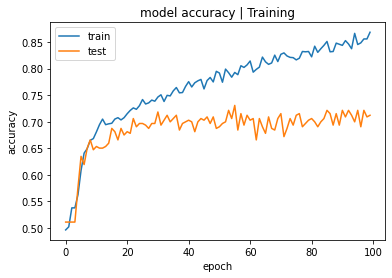

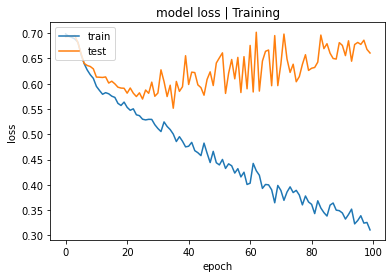

In [45]:
print("Time Training: "+str(end-start))
# list all data in history to plot accuracy
print(history.history.keys())
print('Acc Max:',max(history.history['acc']))
print('Loss Min:',min(history.history['loss']))
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy | Training')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
#plt.savefig("logs/testing/Escenario_1/"+time_saver+"_acc.png")
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss | Training')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
#plt.savefig("logs/testing/Escenario_1/"+time_saver+"_loss.png")
plt.show()
     

In [46]:
from statistics import mean
#Time per epoch
times = time_callback.times
print("Times: {}".format(times))
print("Average time: {}".format(mean(times)))

Times: [65.00825762748718, 71.16390347480774, 62.6933388710022, 63.78146958351135, 64.05803847312927, 63.8797562122345, 63.573238134384155, 62.79082989692688, 62.66255474090576, 63.29284358024597, 63.68710517883301, 63.24923849105835, 63.480161905288696, 61.379568338394165, 62.34389615058899, 63.382606983184814, 63.51637363433838, 63.17336440086365, 62.21194529533386, 61.30872201919556, 63.01122426986694, 63.557427167892456, 64.26026844978333, 63.256789684295654, 61.77296257019043, 63.28909993171692, 63.637500524520874, 63.45376658439636, 63.45135831832886, 61.21427273750305, 65.81581377983093, 62.876508474349976, 63.97253704071045, 63.8366425037384, 63.881115436553955, 63.85319972038269, 61.548272132873535, 63.32899308204651, 63.388981342315674, 63.53593921661377, 63.10862159729004, 61.41913866996765, 62.06261706352234, 63.33711242675781, 63.51122713088989, 63.16873478889465, 61.75961232185364, 61.804892778396606, 63.254111766815186, 63.19338059425354, 63.256227016448975, 61.160208940

In [50]:
y_test = np.array(y_test).astype(np.float64)
history_eval = model.evaluate(x=x_test,y=y_test,batch_size=32,callbacks=callbacks_list)
print(history_eval)

AttributeError: ignored

In [51]:

#model.save('models/model/128CNN-'+time_saver+'.h5')
model.save('/content/models/model/autism/nautism/128CNN-'+time_saver+'.h5',overwrite=True,save_format='h5',include_optimizer=True)
model.save_weights('/content/models/model/autism/nautism/128CNN-'+time_saver+'.h5')

In [52]:
import collections
y_prediction = []
x_images = np.array(x_test).astype(np.float32)/255.0
#x_test = x_test.reshape(-1,128,128,1)
for x_image in x_images:
  x_image = x_image.reshape(-1,128,128,1)
  #print(x_image.shape)
  prediction = model.predict(x_image)
  y_prediction.append(1 if prediction[0][0] >= 0.5 else 0)


y_prediction_array = np.array(y_prediction)
y_test_array = np.array(y_test)
print('y_predicted:',len(y_prediction),y_prediction_array)
print('y_true:',len(y_test),y_test_array)
print('Testing the whole dataset:',collections.Counter(y_prediction_array == y_test_array))

/usr/local/lib/python3.9/dist-packages/keras/engine/training_v1.py:2357: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


y_predicted: 2224 [0 0 1 ... 1 1 0]
y_true: 2224 [0. 0. 1. ... 1. 0. 1.]
Testing the whole dataset: Counter({True: 2005, False: 219})


In [53]:
x_test_evaluate = np.array(x_test).astype(np.float32)/255.0
x_test_evaluate = x_test_evaluate.reshape(-1,128,128,1)
y_test_evaluate = np.array(y_test).astype(np.float32)
print('\n# Evaluate on test data')
results = model.evaluate(x_test_evaluate, y_test_evaluate, batch_size=32)
print('test loss, test acc,binary_crossentropy:', results)

print('\n# Generate predictions for 3 samples')
predictions = model.predict(x_test_evaluate[:3])
print('predictions shape:', predictions.shape)


# Evaluate on test data
test loss, test acc,binary_crossentropy: [0.26419798493814123, 0.9015288, 0.26419798]

# Generate predictions for 3 samples
predictions shape: (3, 1)


In [71]:
  #Testing the algorithm with all the data avariable
import os
y_predicted = []
y_true = []
y_true_labeled = []
def get_predictions():
    for features, label in training_data:
    #print(features)
       prediction=model_save.predict([np.array(features.reshape(-1,128,128,1)).astype(np.float32)/255.0])
       predict = 1 if prediction[0][0] >=0.5 else 0
       y_predicted.append(predict)
       y_true.append(label)
       y_true_labeled.append(categories[label])

get_predictions()
y_predicted = np.array(y_predicted).astype(np.int)
y_true = np.array(y_true,np.uint8)


NameError: ignored

Confusion matrix, without normalization
[[1114    0]
 [   0 1110]]


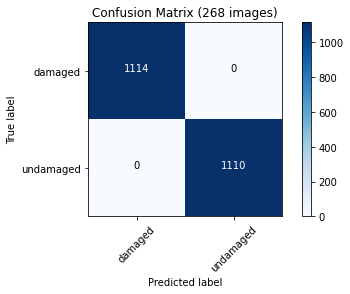

In [72]:
import itertools
import numpy as np
import matplotlib.pyplot as plt

from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

def plot_confusion(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.savefig("docs/confusion_matrix.png",bbox_inches = 'tight')

cnf_matrix = confusion_matrix(y, y_test)
#print(cnf_matrix)
#print(categories)
plt.figure()
plot_confusion(cnf_matrix, classes=categories,normalize=False,title='Confusion Matrix (268 images)')
#ax_.set_title("Matriz de Confusión")

#print(title)
#print(confusion_matrix)

plt.show()


In [61]:
!pip install tensorflow==2.11.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
